Kevin Andrés Restrepo Tobón CC 1000639128
# Solución a la ecuación del calor en 1D
___


In [1]:
import numpy as np
from scipy import integrate
import scipy.fft as fft
import matplotlib as mpl
import matplotlib.cm as cm
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D,axes3d

mpl.rcParams['figure.figsize'] = (8,6)




## Ecuación del calor
La ecuación del calor es una importante ecuación diferencial en derivadas parciales de la forma:
$$
\frac{\partial T}{\partial t} = \alpha(\frac{\partial^2 T}{\partial x^2}+\frac{\partial^2 T}{\partial y^2}+\frac{\partial^2 T}{\partial z^2})
$$


Donde $\alpha$ es la difusividad térmica  y $T$ es una función en las variables $x,y,z$ y $t$ que describe las  variaciones de temperatura de una región a lo largo del tiempo [[1]](#Referencias).


La ecuación se deriva de la ley de Fourier y es el ejemplo primordial de una PDE (partial differential equation) parabólica, se suele escribir en terminos del laplaciano como:
$$
\frac{\partial T}{\partial t} = \alpha\nabla^2 T 
$$

y en el caso particual de una región 1-D escribimos: 

\begin{equation}
                
\frac{\partial T}{\partial t} = \alpha\frac{\partial^2T}{\partial x^2}   
\tag{1}
    

\end{equation}





## Objetivos
Acontinuación, se darán 3 diferentes acercamientos para resolver la ecuación del calor en 1D de forma numérica, en partícular usando métodos como odeint y fft de la librería scipy.

El caso de estudio a usar será el de una barra de plata (debido a su alta difusividad térmica, que para motivos del ejempolo permite observar flujos de calor más rápidamente ) de longitud L con configuraciones iniciales de temperatura distintas.

## Solución por transformada de Fourier

Tal vez uno de los usos más importantes de la transformada de Fourier es la resolución de PDE'S [[2]](#Referencias). Aplicar la transformada de Fourier a la ecuación en cuestion suele simplificar el problema bastante debido a la propiedad de la transformada de una derivada:
$$
\mathcal{F}\{\frac{d^nf(x)}{dx^n}\} = (-i\kappa)^n\mathcal{F}\{f(x)\}
$$

Para la ecuación del calor, transformamos la dependencia x al espacio de frecuencias $\kappa$:
$$
\frac{\partial T(x,t)}{\partial t} = \alpha\frac{\partial^2T(x,t)}{\partial x^2}\\
\downarrow \mathcal{F}\\
\frac{\partial\hat{T}(\kappa,t)}{\partial t} = -\alpha\kappa^2\hat{T}(\kappa,t)
\tag{2}
$$
Donde $\hat{T}$ es la transformada de $T$ [[3]](#Referencias).

Observamos que hemos pasado de una PDE a una ODE en el espacio transformado, basta con solucionar la ecuación en este espacio y aplicar la transformada de fourier inversa a la misma para recuperar $T$.

Consideraremos dos formas de hacer esto: 


### Solución por odeint

Ya que hemos pasado de una PDE a una ODE, se puede usar odeint para obtener una solución al problema.

Se inicializa las constantes y se determina un intervalo de tiempo de 10 minutos, La longitud de la barra se establece a 1 metro y su distribución de temperatura inicial es de una unidad para un intervalo de L/5 centrado en la barra, el calor irá fluyendo del centro de la barra hacia los lados.

$\kappa$ es la muestra de frecuencias a usar en la ecuación (2) obtenida con el método ```fftfrq()``` del paquete dedicado a transformaciones de Fourier de la librería scipy.

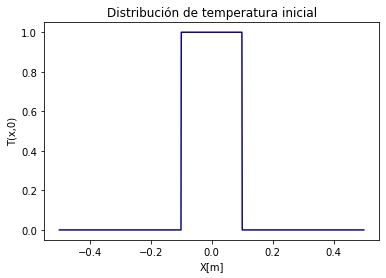

In [2]:
α = 149e-6 #difusividad térmica
tf = 10*60 #tiempo final
L = 1 #Longitud de la barra
N = 1000  #número de discretizaciones
Temp = 1 #temperatura inicial

x = np.arange(-L/2,L/2,L/N)
κ = fft.fftfreq(N,d = L/N)
T0 = np.zeros_like(x)
T0[int((L/2-L/10)*N/L):int((L/2+L/10)*N/L)] = Temp


plt.figure(figsize=((6,4)))
plt.plot(x,T0,color = cm.plasma(0))
plt.title('Distribución de temperatura inicial')
plt.xlabel('X[m]')
plt.ylabel('T(x,0)')
plt.show()



Ya que se resuelve la ecuación en el espacio transformado, es necesario transformar la temperatura inicial, se usa ```fft()```, que computa la FFT(fast fourier transformation) de un conjunto de datos. La FFT es un algoritmo eficiente para calcular la DFT (Discret fourier transformation) y es estándar en todos los métodos para calcular transformaciones de fourier de forma numérica [[4]](#Referencias).

La función odeint tiene problemas al tratar con complejos, por lo que es necesario usar ``` concatenate()``` para separar el array T0fft, de dimensión N, en un array T0fftconcat de dimensión 2N donde en  \[:N] están los valores reales y \[N:] los imaginarios, posteriormente se reconstruye el array con números complejos. Se tiene en cuenta esto mismo al definir dT_dt, de lo contrario resultaría un ```TypeError: Cannot cast array data from dtype('complex128') to dtype('float64') according to the rule 'safe'```


In [3]:
T0fft = fft.fft(T0) 
T0fftconcat = np.concatenate((T0fft.real,T0fft.imag)) #Se separa el array en su parte real e imaginaria

def dT_dt(Tfftconcat,t,κ=κ,α=α):
    Tfft = Tfftconcat[:N] + 1j*Tfftconcat[N:] #se reconstruye el array
    dT = -α*κ**2*Tfft #se hace uso de (2)
    dTconcat = np.concatenate((dT.real,dT.imag)) #se separa el array resultante
    return dTconcat

dt = tf/1000
t = np.arange(0,tf,dt)  
Tfftconcat = integrate.odeint(dT_dt,T0fftconcat,t)
Tfft = Tfftconcat[:,:N] + 1j*Tfftconcat[:,N:] #Se reconstruye el array


Finalmente se construye los valores de Temperatura para cada tiempo usando ```ifft``` para calcular la transformada inversa de Tfft, de la que sólo nos interesa sus valores reales.

In [4]:
T = np.zeros_like(Tfft)
for k in range(len(t)):
    T[k,:] = fft.ifft(Tfft[k,:])
T = T.real

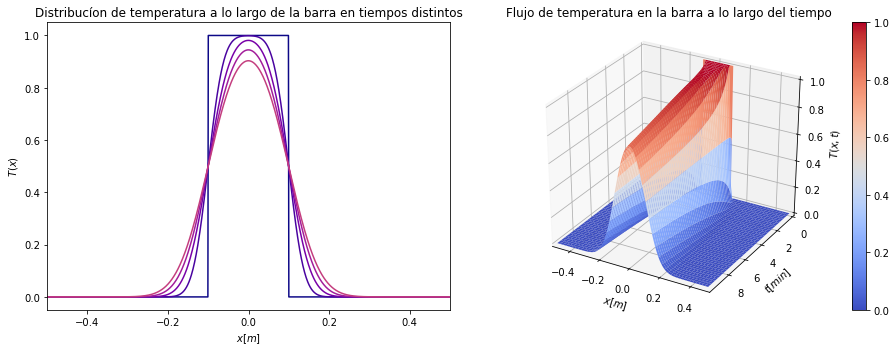

In [5]:
fig = plt.figure(figsize=(13,5))
ax = fig.add_subplot(121)
steps = tf/(dt*5) #5 intervalos de tiempo
Tplot = T[0:-1:int(steps),:] #elijo los 5 estados de T que quiero mostrar en la primera gráfica, estos separados por intervalos iguales steps

for j in range(Tplot.shape[0]):
    ax.plot(x,Tplot[j,:],color = cm.plasma(j*30))
    

ax.set_xlim(-L/2,L/2)
plt.title('Distribucíon de temperatura a lo largo de la barra en tiempos distintos')
ax.set_xlabel('$x[m]$')
ax.set_ylabel('$T(x)$')

#---------------------------------------------------------------------------------------
#-------------------------------Gráfica de superficie---------------------------------

ax = fig.add_subplot(122,projection='3d')

X,Y = np.meshgrid(x,t)
surf = ax.plot_surface(X, Y/60, T,cmap = 'coolwarm')

plt.ylim(t[-1]/60,t[0]/60) #invertir el eje y
ax.set_xlim(-L/2,L/2)
plt.title('Flujo de temperatura en la barra a lo largo del tiempo', loc = 'right')
ax.set_xlabel('$x[m]$')
ax.set_ylabel('$t[min]$')
ax.set_zlabel('$T(x,t)$')
plt.tight_layout()
fig.colorbar(surf)



plt.show()


### Solución analítica

La solución de la ecuación diferencial ordinaria
$$
\frac{\partial\hat{T}(\kappa,t)}{\partial t} = -\alpha\kappa^2\hat{T}(\kappa,t)
$$
sería:
$$
\hat{T}(\kappa,t) = -\alpha\kappa^2t + ln(C(\kappa))
$$
i.e:
$$
\hat{T} = C(\kappa)e^{-\alpha\kappa^2t}
\tag{3}
$$
Donde $C(\kappa)$ es la distribución inicial de $\hat{T}$, osea; la transformada de fourier de la distribución de temperatura inicial $T(x,0)$.

Aplicando al transformada inversa:
$$
T(x,t) = \frac{1}{2\pi}\int_{-\infty}^{\infty}C(\kappa)e^{-\alpha\kappa^2t}e^{-i\kappa x}d\kappa
$$

Se crea la matriz Transformación de T definida por (3), $C(\kappa)$ sería T0fft (la Transformación de fourier de la temperatura inicial), T será la transformada inversa de los arrays para cada tiempo de lo anterior.

In [6]:
TfftA = np.zeros((t.size,x.size)) #se inicializa la matriz transformada y TA
TA = np.zeros_like(TfftA)
i = 0
for k in t:
    TfftA[i,:] = T0fft*np.exp(-α*κ**2*k)
    TA[i,:] = fft.ifft(TfftA[i,:])
    i += 1


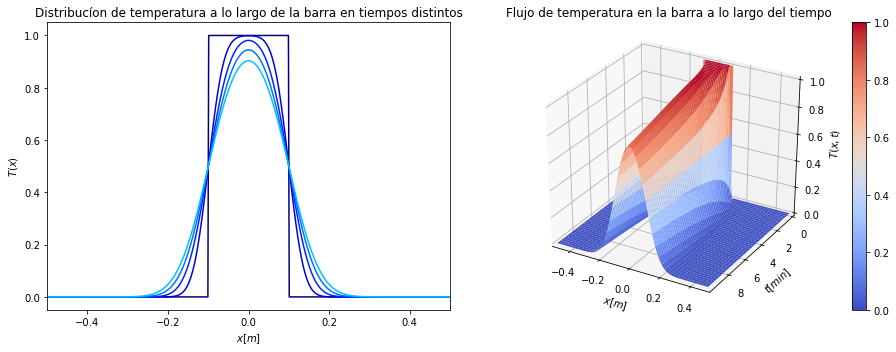

In [7]:
fig = plt.figure(figsize=(13,5))
ax = fig.add_subplot(121)
steps = tf/(dt*5) #5 intervalos de tiempo
TAplot = TA[0:-1:int(steps),:]

for j in range(TAplot.shape[0]):
    ax.plot(x,TAplot[j,:],color = cm.jet(j*20))
    

ax.set_xlim(-L/2,L/2)
plt.title('Distribucíon de temperatura a lo largo de la barra en tiempos distintos')
ax.set_xlabel('$x[m]$')
ax.set_ylabel('$T(x)$')
#---------------------------------------------------------------------------------------
#-------------------------------Gráfica de superficie---------------------------------
ax = fig.add_subplot(122,projection='3d')
X,Y = np.meshgrid(x,t)
surf = ax.plot_surface(X, Y/60, TA,cmap = 'coolwarm')

plt.ylim(t[-1]/60,t[0]/60) #invertir el eje y
ax.set_xlim(-L/2,L/2)
plt.title('Flujo de temperatura en la barra a lo largo del tiempo', loc = 'right')
plt.tight_layout()
ax.set_xlabel('$x[m]$')
ax.set_ylabel('$t[min]$')
ax.set_zlabel('$T(x,t)$')

fig.colorbar(surf)

plt.show()




Donde observamos que ambas formas de solución son compatibles:

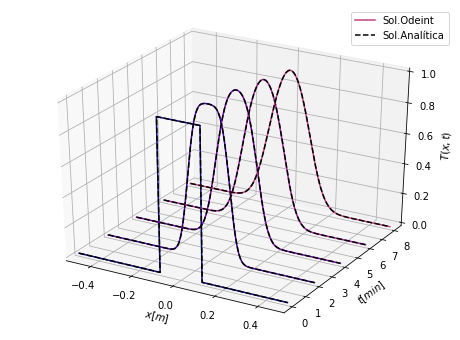

In [8]:
fig = plt.figure()
ax = fig.add_subplot(111,projection = '3d')
seg = 0
for j in range(Tplot.shape[0]):
    line1, = ax.plot(x,seg*np.ones(len(x))/60,Tplot[j,:],color = cm.plasma(j*30))
    line2, = ax.plot(x,seg*np.ones(len(x))/60,TAplot[j,:],'k--')
    seg = seg + int(steps)*dt 

ax.set_xlim(-L/2,L/2)
ax.set_xlabel('$x[m]$')
ax.set_ylabel('$t[min]$')
ax.set_zlabel('$T(x,t)$')
plt.legend((line1, line2), ('Sol.Odeint', 'Sol.Analítica'))



plt.show()


## Solución por separación

Empezamos con la suposición de que T(x,t) se puede escribir como la multiplicación de dos funciones en espacio y tiempo [[5]](#Referencias).
$$
T(x,t) = X(x)\mathcal{T}(t)
$$
Al reemplazar esto en (1) y separando las variables obtenemos:

\begin{equation}
\alpha\frac{\dot{\mathcal{T}}}{\mathcal{T}} = \frac{X''}{X} 
\tag{4}
\end{equation}

con $X'' = \frac{d^2X}{dx^2}$ y $\dot{\mathcal{T}} = \frac{d\mathcal{T}}{dt}$.

La igualdad entre las razones de cambio en (4), cuyo lado izquierdo sólo depende de t y lado derecho sólo depende de x implica que

\begin{equation}
\alpha\frac{\dot{\mathcal{T}}}{\mathcal{T}} = \frac{X''}{X} = \lambda
\end{equation}
Para alguna constante $\lambda$. 
Como resultado tenemos dos ODE:
\begin{equation}
X'' = X\lambda \\
\dot{\mathcal{T}} = \tfrac{1}{\alpha}\lambda \mathcal{T}
\end{equation}
Cuyas soluciones son:
\begin{equation}
X = Bsen(\tfrac{n\pi}{L}x)\\
\mathcal{T} = e^{-\dfrac{n^2\pi^2}{\alpha L^2}t}C
\end{equation}
Con B, C constantes, L la longitud de la barra y n= 1,2,3,.. $T$ es la multiplicación de $X$ y $\mathcal{T}$ donde para cada n se obtiene una solución diferente.

Al ser (1) lineal, la solución más general será la superposición de todas las soluciones:
\begin{equation}
T(x,t) = \sum_{n=1}^{\infty}b_nsen(\tfrac{n\pi}{L}x)e^{-\dfrac{n^2\pi^2}{\alpha L^2}t}
\end{equation}
Y para t= 0:
\begin{equation}
T(x,0) = \sum_{n=1}^{\infty}b_nsen(\tfrac{n\pi}{L}x) = f(x)
\end{equation}
Que se trata de la serie de fourier en senos de la función f(x) que describe la distribución de temperatura inicial. Por lo que los coeficientes bn están dados por:

\begin{equation}
b_n = \frac{2}{L}\int_{-L}^{L}f(x)sen(\frac{n\pi x}{L})dx, 
   n = 1,2,..

\end{equation}

Para una barra con de longitud L con temperatura inicial = T0, constante en toda su longitud excepto en los extremos, donde se mantiene a cero grados, estos coeficientes son:
\begin{equation}
b_n = \frac{4T_0}{n\pi}
\end{equation}
Para n impar. Luego:
\begin{equation}
T(x,t) = \sum_{n=1}^{\infty}\frac{4T_0}{n\pi}sen(\tfrac{n\pi}{L}x)e^{-\dfrac{n^2\pi^2}{\alpha L^2}t}
\tag{5}
\end{equation}

La solución aquí depende bastante de las condiciones iniciales, por lo que se eligió una distribución de temperatura inicial $b_n$ cuyos coeficientes de la serie de senos fueran suficientemente sencillos de calcular e implementar.

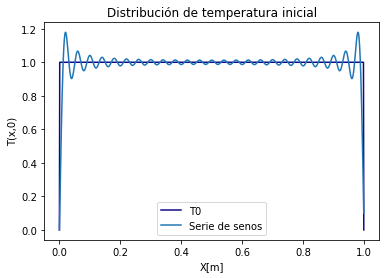

In [9]:
x = np.arange(0,L,L/N)
dt = tf/1000
t = np.arange(0,tf,dt)  
T0 = np.zeros_like(x)
T0[1:-1] = Temp

def bn(n,Temp = Temp):
    '''
    Coeficientes de la serie en senos de f(x)
    '''
    return 4*Temp/(n*np.pi)

def y2(x):
    '''
    Aproximación por series de senos de f(x) inicial
    '''
    y = 0
    for n in range(1,50,2):
        y += bn(n)*np.sin(n*np.pi/(L)*x) 
    return y


plt.figure(figsize=((6,4)))
plt.plot(x,T0,color = cm.plasma(0),label = 'T0')
plt.plot(x,y2(x),label ='Serie de senos')

plt.title('Distribución de temperatura inicial')
plt.xlabel('X[m]')
plt.ylabel('T(x,0)')
plt.legend()
plt.show()

definimos la función dada en (5), Niter es el número de iteraciones de la suma, mientras más alto mejor es la aproximación de la solución

In [10]:
def heat(x,t,Niter = 100,L = L):
    '''
    Implementación de la fórmula (5)
    '''
    suma = 0

    for n in range(1,Niter,2):
        suma += bn(n)*np.sin(n*np.pi/(L)*x)*np.exp(-(n**2*np.pi**2)/(L**2)*t*α)
    return suma

T = np.zeros((t.size,x.size))
i = 0
for k in t:
    T[i,:] = heat(x,t = k) #se aplica (5) para cada punto en t
    i += 1


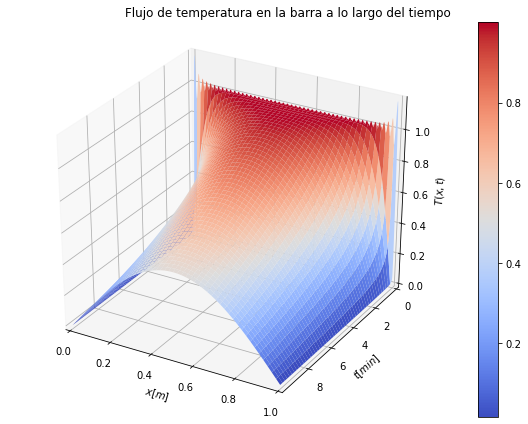

In [11]:
fig = plt.figure()
ax = fig.add_subplot(111,projection='3d')
X,Y = np.meshgrid(x,t)
surf = ax.plot_surface(X, Y/60, T,cmap = 'coolwarm')

plt.ylim(t[-1]/60,t[0]/60) #invertir el eje y
ax.set_xlim(0,L)
plt.title('Flujo de temperatura en la barra a lo largo del tiempo', loc = 'right')
plt.tight_layout()
ax.set_xlabel('$x[m]$')
ax.set_ylabel('$t[min]$')
ax.set_zlabel('$T(x,t)$')



fig.colorbar(surf)

plt.show()


---

## Conclusiones
*   La solución analítica por transformada de Fourier es probablemente la más eficiente y sencilla de implementar, la solución por separación de variables seguramente la que menos debido a su gran coste computacional proporcional al número de iteraciones de la suma y a su dependencia de si se puede encontra los coeficientes $b_n$.
*   Puede ser posible encontrar los coeficientes $b_n$ usando la FFT [[6]](#Referencias), reduciendo esto los limitantes al establecer una temperatura inicial abitraria.
*   Aunque trabajar la ecuación en 1D parezca limitante, esto puede ser una muy buena aproximación para sistemas en donde el flujo de calor sólo sea en una dirección como es el caso de la barra: se encuentra aislada totalmente excepto en los extremos, por lo que no hay calor fluyendo de arriba a abajo y considerar el sistema uno-dimensional es válido. 


# Referencias
<a id='referencias'></a>

\[1] https://es.wikipedia.org/wiki/Ecuaci%C3%B3n_del_calor

\[2] https://en.wikipedia.org/wiki/Fourier_transform#Applications

\[3] Arfken, G., Weber, H. and Harris, F., 2013. Mathematical Methods For Physicists. 7th ed. Amsterdam: Elsevier, p.983.

\[4] https://docs.scipy.org/doc/scipy/reference/tutorial/fft.html

\[5] Landau, R., Páez, M. and Bordeianu, C., n.d. Computational Physics: Problem Solving With Computers. p.407.

\[6] https://dspillustrations.com/pages/posts/misc/the-complex-fourier-series-and-its-relation-to-the-fourier-transform.html